In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style= "darkgrid", color_codes = True)
from PIL import Image
import os
import shutil
import random

import keras.utils
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Conv2DTranspose, Reshape, BatchNormalization, Dropout, Input, ReLU, LeakyReLU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.utils import image_dataset_from_directory

import warnings
warnings.filterwarnings('ignore')

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("greatgamedota/ffhq-face-data-set")

print("Path to dataset files:", path)

100%|██████████| 1.97G/1.97G [00:31<00:00, 67.2MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/greatgamedota/ffhq-face-data-set/versions/2


# **CHUẨN BỊ DATA**

In [ ]:
dir = "/root/.cache/kagglehub/datasets/greatgamedota/ffhq-face-data-set/versions/2/thumbnails128x128"
dir_path = "/content/DATA"

# Tạo thư mục con "all_images" chứa tất cả ảnh
os.makedirs(dir_path, exist_ok=True)
os.makedirs(os.path.join(dir_path, "DATASET"), exist_ok=True)

for img_file in os.listdir(dir):
    if img_file.endswith(('.png', '.jpg', '.jpeg')):
        shutil.copy(os.path.join(dir, img_file), os.path.join(dir_path, "DATASET", img_file))

print(f"Organized dataset into: {dir_path}")

Organized dataset into: /content/DATA


In [ ]:
!ls /content/DATA/DATASET

00000.png  07778.png  15556.png  23334.png  31112.png  38890.png  46668.png  54446.png	62224.png
00001.png  07779.png  15557.png  23335.png  31113.png  38891.png  46669.png  54447.png	62225.png
00002.png  07780.png  15558.png  23336.png  31114.png  38892.png  46670.png  54448.png	62226.png
00003.png  07781.png  15559.png  23337.png  31115.png  38893.png  46671.png  54449.png	62227.png
00004.png  07782.png  15560.png  23338.png  31116.png  38894.png  46672.png  54450.png	62228.png
00005.png  07783.png  15561.png  23339.png  31117.png  38895.png  46673.png  54451.png	62229.png
00006.png  07784.png  15562.png  23340.png  31118.png  38896.png  46674.png  54452.png	62230.png
00007.png  07785.png  15563.png  23341.png  31119.png  38897.png  46675.png  54453.png	62231.png
00008.png  07786.png  15564.png  23342.png  31120.png  38898.png  46676.png  54454.png	62232.png
00009.png  07787.png  15565.png  23343.png  31121.png  38899.png  46677.png  54455.png	62233.png
00010.png  07788.png  15566.pn

In [ ]:
# Load dataset từ thư mục
img_width, img_height = 128, 128
batchsize = 32

train_dataset = image_dataset_from_directory(
    directory=dir_path,
    batch_size=batchsize,
    image_size=(img_width, img_height),  # Resize ảnh
    shuffle=True,  # Ngẫu nhiên ảnh
)

# Kiểm tra một batch
for images, labels in train_dataset.take(1):
    print(f"Batch image shape: {images.shape}, Batch labels: {labels.shape}")


Found 70000 files belonging to 1 classes.
Batch image shape: (32, 128, 128, 3), Batch labels: (32,)


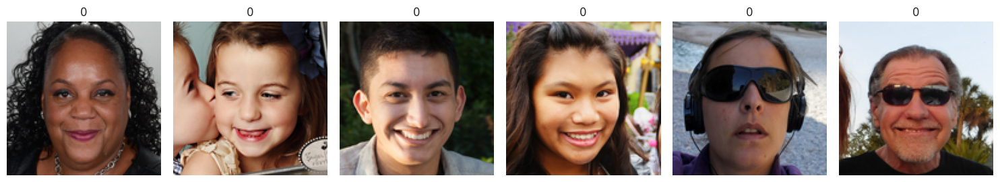

In [ ]:
data_iterator = train_dataset.as_numpy_iterator()
batch = data_iterator.next()

fig, ax = plt.subplots(nrows=1, ncols=6, figsize=(15, 18))
ax = ax.flatten()

for idx, img in enumerate(batch[0][:6]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])
    ax[idx].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Đường dẫn
temp_path = "/content/DATA_SCALE"
dataset_path = "/content/DATA/DATASET"
class_folder = os.path.join(temp_path, "class")  # Thư mục con cho ảnh
batchsize = 32

# Xóa dữ liệu cũ và tạo lại thư mục
if os.path.exists(temp_path):
    shutil.rmtree(temp_path)
os.makedirs(class_folder, exist_ok=True)

# Lấy danh sách ảnh
images = [f for f in os.listdir(dataset_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Chuyển 32,000 ảnh ngẫu nhiên
for img in random.sample(images, min(32000, len(images))):
    shutil.move(os.path.join(dataset_path, img), os.path.join(class_folder, img))
print(f"Đã chuyển {min(32000, len(images))} ảnh.")

# Tạo ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1/255, horizontal_flip=True)
train_generator = train_datagen.flow_from_directory(
    temp_path, target_size=(64, 64), batch_size=batchsize, class_mode=None
)

Đã chuyển 32000 ảnh.
Found 32000 images belonging to 1 classes.


# **MODEL**

In [ ]:
# Tạo bộ khởi tạo trọng số ngẫu nhiên với phân phối chuẩn
KI = RandomNormal(mean=0.0, stddev=0.02)

# Định nghĩa kích thước đầu vào của noise (latent space vector)
input_dim = 256

In [ ]:
# Hàm tạo Generator Model
def Generator_Model():
    Generator = Sequential()

    # Lớp đầu tiên: Nhận đầu vào là noise (vector 1D) và chuyển đổi thành một tensor 8x8x1024
    Generator.add(Dense(8 * 8 * 1024, input_dim=input_dim))  # Fully connected layer
    Generator.add(ReLU())  # Hàm kích hoạt ReLU để giới thiệu tính phi tuyến

    # Reshape tensor 1D thành tensor 3D có kích thước 8x8x1024 (chuẩn bị để upsample)
    Generator.add(Reshape((8, 8, 1024)))

    # Lớp Conv2DTranspose 1: Upsample tensor từ 8x8x1024 lên 16x16x512
    Generator.add(Conv2DTranspose(512, (4, 4), strides=(2, 2), padding='same',
                                  kernel_initializer=KI, activation='relu'))

    # Lớp Conv2DTranspose 2: Upsample tensor từ 16x16x512 lên 32x32x256
    Generator.add(Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same',
                                  kernel_initializer=KI, activation='relu'))

    # Lớp Conv2DTranspose 3: Upsample tensor từ 32x32x256 lên 64x64x128
    Generator.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same',
                                  kernel_initializer=KI, activation='relu'))

    # Lớp đầu ra: Chuyển tensor 64x64x128 thành 64x64x3 (3 kênh RGB) và sử dụng sigmoid để đưa giá trị pixel về [0, 1]
    Generator.add(Conv2D(3, (4, 4), padding='same', activation='sigmoid'))

    return Generator  # Trả về mô hình generator


In [ ]:
# Khởi tạo Generator
generator = Generator_Model()

# Hiển thị cấu trúc mô hình (summary)
generator.summary()

#Vẽ sơ đồ cấu trúc mô hình Generator, hiển thị hình dạng (shapes) của từng layer
#keras.utils.plot_model(generator, show_shapes=True)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 65536)               │      16,842,752 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 512)         │       8,389,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 256)         │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 3)           │           6,147 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,859,843 (106.28 MB)

 Trainable params: 27,859,843 (106.28 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
def Discriminator_Model():
    input_shape = (64, 64, 3)  # Đầu vào của mô hình: ảnh RGB kích thước 64x64x3

    # Tạo mô hình Sequential cho Discriminator
    discriminator = Sequential()

    # Lớp Conv2D 1: Trích xuất đặc trưng từ ảnh, sử dụng 64 kernel kích thước 3x3
    discriminator.add(Conv2D(64, kernel_size=(3, 3), input_shape=input_shape))  # Định nghĩa kích thước đầu vào
    discriminator.add(LeakyReLU(alpha=0.2))  # Hàm kích hoạt LeakyReLU (để tránh chết neuron)
    discriminator.add(MaxPooling2D(pool_size=(2, 2)))  # Lấy mẫu giảm chiều kích thước 1/2 (32x32x64)

    # Lớp Conv2D 2: Tăng số lượng kernel lên 128 để trích xuất đặc trưng sâu hơn
    discriminator.add(Conv2D(128, kernel_size=(3, 3)))
    discriminator.add(LeakyReLU(alpha=0.2))  # Thêm tính phi tuyến bằng LeakyReLU
    discriminator.add(MaxPooling2D(pool_size=(2, 2)))  # Lấy mẫu giảm chiều kích thước 1/2 (16x16x128)

    # Lớp Conv2D 3: Tăng số lượng kernel lên 256
    discriminator.add(Conv2D(256, kernel_size=(3, 3)))
    discriminator.add(LeakyReLU(alpha=0.2))
    discriminator.add(MaxPooling2D(pool_size=(2, 2)))  # Lấy mẫu giảm chiều kích thước 1/2 (8x8x256)

    # Lớp Flatten: Chuyển đổi tensor 3D (8x8x256) thành vector 1D để đưa vào Fully Connected Layer
    discriminator.add(Flatten())

    # Lớp Dense 1: Fully connected với 256 neuron
    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(alpha=0.2))  # Kích hoạt bằng LeakyReLU

    # Lớp Dense 2 (đầu ra): Chuyển đổi về giá trị xác suất (1 neuron, hàm kích hoạt sigmoid)
    discriminator.add(Dense(1, activation='sigmoid'))  # Dự đoán ảnh là thật (1) hoặc giả (0)

    return discriminator

In [ ]:
# Khởi tạo mô hình Discriminator
discriminator = Discriminator_Model()

# Hiển thị cấu trúc mô hình
discriminator.summary()

# Vẽ sơ đồ cấu trúc mô hình Discriminator và hiển thị hình dạng (shapes) của từng lớp
#keras.utils.plot_model(discriminator, show_shapes=True)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 62, 62, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 31, 31, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 29, 29, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 29, 29, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 6, 6, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │       2,359,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,730,625 (10.42 MB)

 Trainable params: 2,730,625 (10.42 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim=input_dim):
        super().__init__()
        self.generator = generator  # Mô hình Generator
        self.discriminator = discriminator  # Mô hình Discriminator
        self.latent_dim = latent_dim  # Kích thước vector noise đầu vào (latent space)
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')  # Đo lường loss của Generator
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')  # Đo lường loss của Discriminator

    @property
    def metrics(self):
        # Trả về các metric để theo dõi trong quá trình huấn luyện
        return [self.g_loss_metric, self.d_loss_metric]

    # Hàm khởi tạo trình biên dịch
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer  # Optimizer cho Generator
        self.d_optimizer = d_optimizer  # Optimizer cho Discriminator
        self.loss_fn = loss_fn  # Hàm tính loss (binary cross-entropy)

    # Hàm thực hiện một bước huấn luyện (train_step)
    def train_step(self, real_images):
        # Lấy batch size từ dữ liệu đầu vào
        batch_size = tf.shape(real_images)[0]

        # Tạo noise ngẫu nhiên để đưa vào Generator
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Huấn luyện mô hình Discriminator với ảnh thật (1) và ảnh giả (0)
        with tf.GradientTape() as tape:
            # Tính dự đoán (predictions) trên ảnh thật
            pred_real = self.discriminator(real_images, training=True)
            # Tạo nhãn ảnh thật (giá trị gần 1), sử dụng label smoothing
            real_labels = tf.ones((batch_size, 1))
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))  # Thêm nhiễu nhẹ vào nhãn
            d_loss_real = self.loss_fn(real_labels, pred_real)  # Tính loss trên ảnh thật

            # Tạo ảnh giả từ Generator
            fake_images = self.generator(random_noise)
            # Tính dự đoán trên ảnh giả
            pred_fake = self.discriminator(fake_images, training=True)
            # Tạo nhãn ảnh giả (giá trị gần 0)
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)  # Tính loss trên ảnh giả

            # Tổng loss của Discriminator
            d_loss = (d_loss_real + d_loss_fake) / 2

        # Tính gradient của Discriminator
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Cập nhật trọng số của Discriminator
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

        # Huấn luyện mô hình Generator
        labels = tf.ones((batch_size, 1))  # Generator muốn Discriminator nghĩ rằng ảnh giả là thật
        with tf.GradientTape() as tape:
            # Tạo ảnh giả từ Generator
            fake_images = self.generator(random_noise, training=True)
            # Tính dự đoán của Discriminator trên ảnh giả
            pred_fake = self.discriminator(fake_images, training=True)
            # Tính loss của Generator (muốn Discriminator dự đoán nhãn là 1)
            g_loss = self.loss_fn(labels, pred_fake)

        # Tính gradient của Generator
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # Cập nhật trọng số của Generator
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # Cập nhật trạng thái metric cho cả hai mô hình
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        # Trả về giá trị loss của Discriminator và Generator sau mỗi bước huấn luyện
        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

In [ ]:
class DCGANCallback(keras.callbacks.Callback):
    def __init__(self, num_imgs=36, latent_dim=256, model_dir="/content/drive/MyDrive/GAN_MODEL/model", save_freq=10):
        """
        Hàm khởi tạo:
        - num_imgs: Số lượng ảnh được tạo ra mỗi lần hiển thị
        - latent_dim: Kích thước không gian ẩn (latent space) làm đầu vào cho Generator
        - model_dir: Thư mục lưu mô hình
        - save_freq: Tần suất lưu mô hình và xuất ảnh (sau mỗi n epoch)
        """
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        self.save_freq = save_freq
        self.model_dir = model_dir

        # Tạo noise ngẫu nhiên (dùng cố định để so sánh qua các epoch)
        self.noise = tf.random.normal([num_imgs, latent_dim])

        # Kiểm tra và tạo thư mục lưu trữ mô hình
        if not os.path.exists(model_dir):
            os.makedirs(model_dir)

    def on_epoch_end(self, epoch, logs=None):
        """
        Hàm này được gọi sau khi mỗi epoch kết thúc.
        - epoch: Số thứ tự của epoch hiện tại
        - logs: Giá trị loss và các metric khác tại epoch đó
        """
        # --- Phần hiển thị ảnh ---
        if (epoch + 1) % self.save_freq == 0:
            # Dùng Generator để tạo ảnh từ noise
            g_img = self.model.generator(self.noise, training=False)
            # Chuẩn hóa ảnh về khoảng [0, 1] để trực quan hóa
            g_img = (g_img + 1) / 2.0

            # Vẽ ảnh theo dạng lưới
            grid_size = int(np.sqrt(self.num_imgs))
            fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
            for i, ax in enumerate(axes.flat):
                ax.imshow(g_img[i].numpy().squeeze(), cmap='gray')
                ax.axis('off')
            plt.suptitle(f"Generated Images After {epoch + 1} Epochs")
            plt.tight_layout()
            plt.show()

        # --- Phần lưu mô hình ---
        if (epoch + 1) % self.save_freq == 0:
            model_filename = os.path.join(self.model_dir, f"dcgan_epoch_{epoch+1}.h5")
            self.model.save(model_filename)
            print(f"Model saved at {model_filename}")


Epoch 1/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 61s 48ms/step - d_loss: 0.6280 - g_loss: 0.8176
Epoch 2/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 71s 46ms/step - d_loss: 0.6789 - g_loss: 0.7867
Epoch 3/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 46ms/step - d_loss: 0.6824 - g_loss: 0.7666
Epoch 4/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 48s 48ms/step - d_loss: 0.6769 - g_loss: 0.7857
Epoch 5/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 47s 47ms/step - d_loss: 0.6718 - g_loss: 0.8004
Epoch 6/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 47ms/step - d_loss: 0.6575 - g_loss: 0.8447
Epoch 7/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 46s 46ms/step - d_loss: 0.6585 - g_loss: 0.8498
Epoch 8/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 46ms/step - d_loss: 0.6553 - g_loss: 0.8620
Epoch 9/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 46ms/step - d_loss: 0.6479 - g_loss: 0.9100
Epoch 10/100
 999/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - d_loss: 0.6420 - g_loss: 0.9177

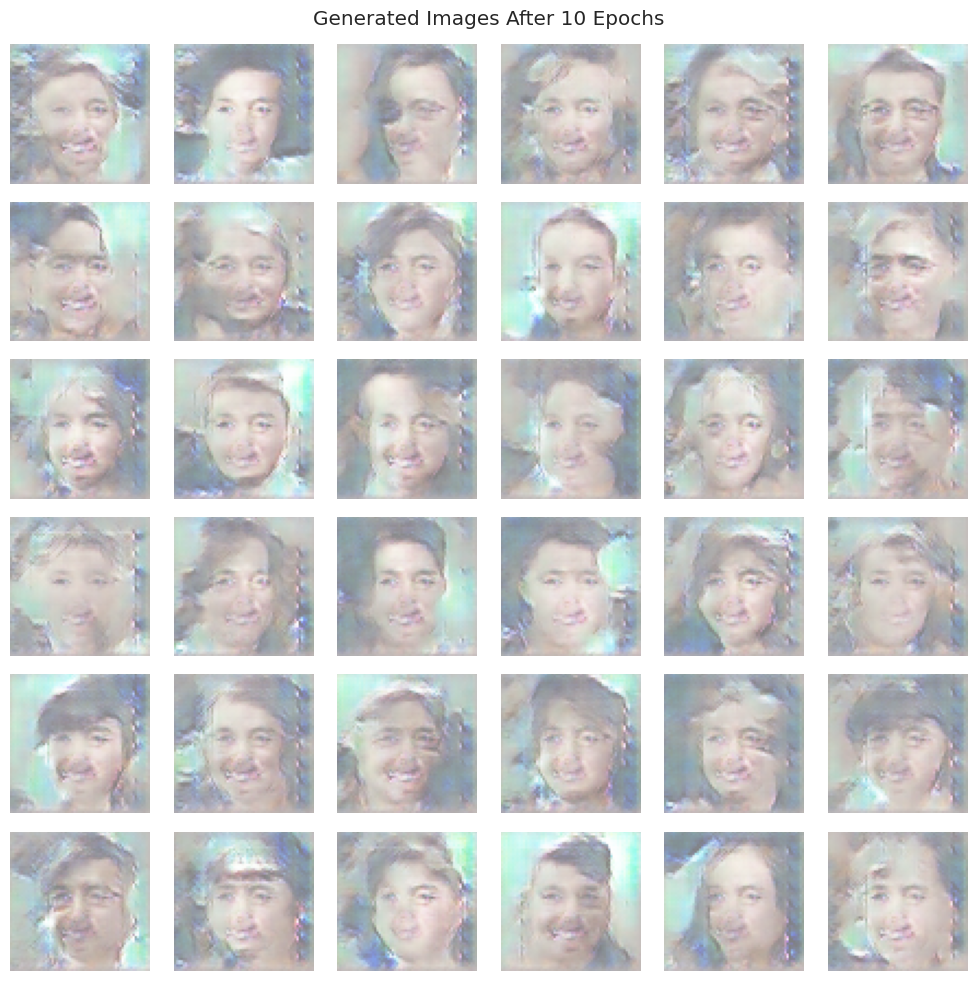

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_10.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 53s 53ms/step - d_loss: 0.6420 - g_loss: 0.9178
Epoch 11/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 52ms/step - d_loss: 0.6395 - g_loss: 0.9255
Epoch 12/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 53s 53ms/step - d_loss: 0.6465 - g_loss: 0.9143
Epoch 13/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 54s 54ms/step - d_loss: 0.6431 - g_loss: 0.8983
Epoch 14/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 52ms/step - d_loss: 0.6314 - g_loss: 0.9460
Epoch 15/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 55s 55ms/step - d_loss: 0.6158 - g_loss: 0.9920
Epoch 16/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 55ms/step - d_loss: 0.6125 - g_loss: 1.0256
Epoch 17/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 55ms/step - d_loss: 0.6042 - g_loss: 1.0538
Epoch 18/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 56s 56ms/step - d_loss: 0.5926 - g_loss: 1.1294
Epoch 19/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 56s 55ms/step - d_loss: 0.5957 - g_loss: 1.1099
Epoch 20/100
 999/100

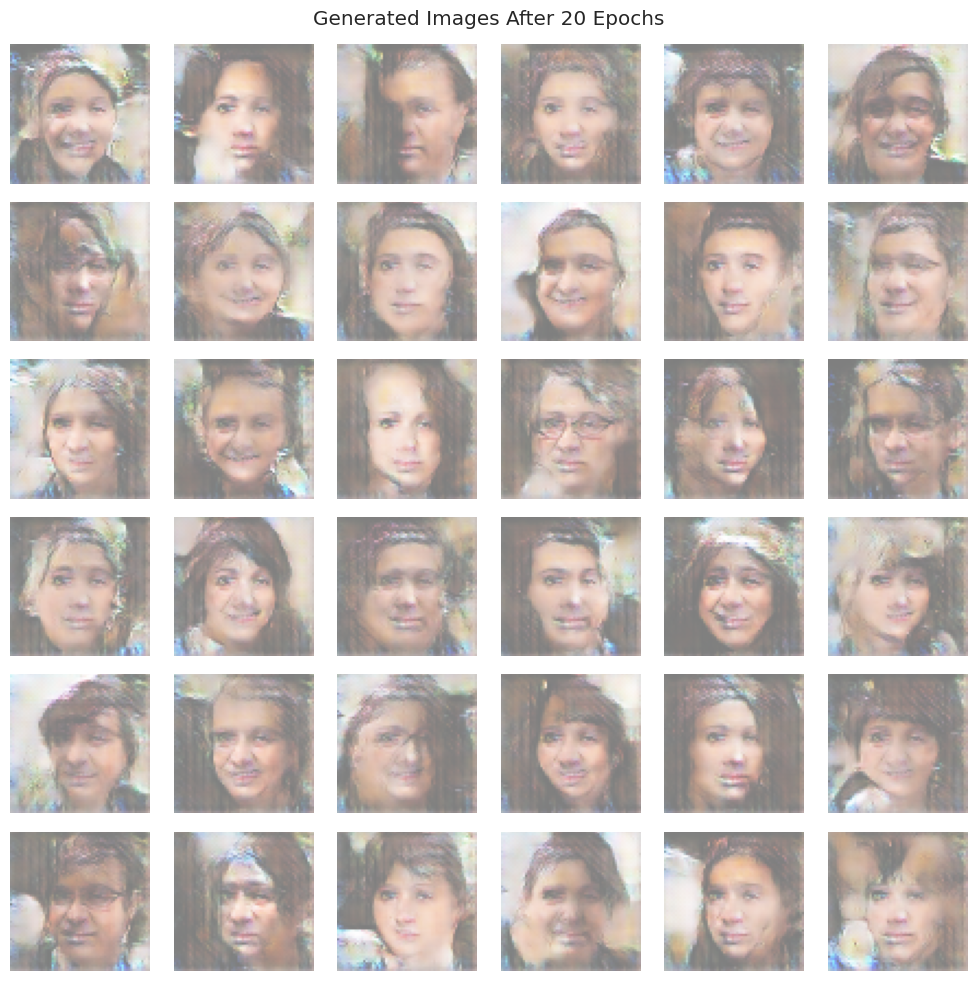

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_20.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 84s 58ms/step - d_loss: 0.5993 - g_loss: 1.1379
Epoch 21/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.5790 - g_loss: 1.1317
Epoch 22/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 64s 64ms/step - d_loss: 0.5794 - g_loss: 1.1751
Epoch 23/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 63ms/step - d_loss: 0.5709 - g_loss: 1.1643
Epoch 24/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 63ms/step - d_loss: 0.5613 - g_loss: 1.2255
Epoch 25/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 61s 60ms/step - d_loss: 0.5663 - g_loss: 1.2231
Epoch 26/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 63s 62ms/step - d_loss: 0.5526 - g_loss: 1.2538
Epoch 27/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 61ms/step - d_loss: 0.5410 - g_loss: 1.3140
Epoch 28/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.5397 - g_loss: 1.3353
Epoch 29/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 63ms/step - d_loss: 0.5306 - g_loss: 1.3439
Epoch 30/100
1000/100

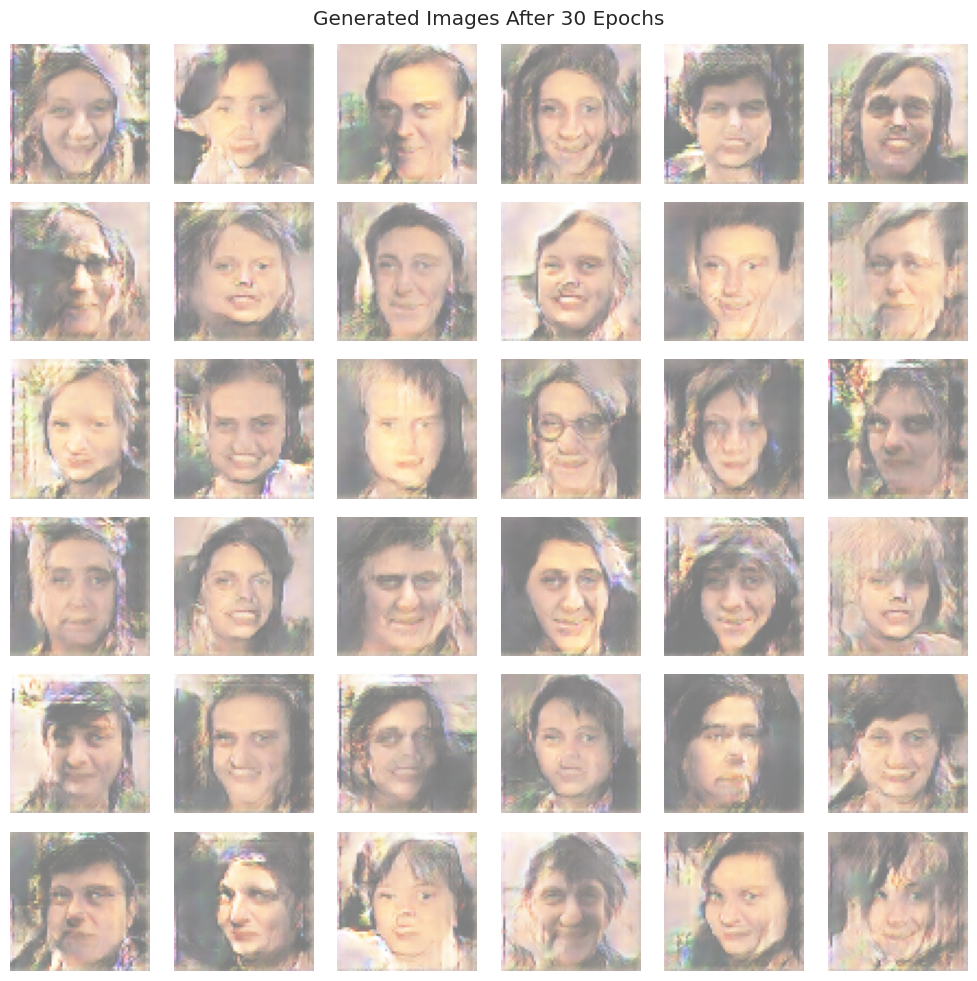

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_30.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 86s 67ms/step - d_loss: 0.5377 - g_loss: 1.3378
Epoch 31/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 87s 72ms/step - d_loss: 0.5408 - g_loss: 1.3389
Epoch 32/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 71s 71ms/step - d_loss: 0.5327 - g_loss: 1.3934
Epoch 33/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 71ms/step - d_loss: 0.5296 - g_loss: 1.4360
Epoch 34/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 71ms/step - d_loss: 0.5261 - g_loss: 1.3901
Epoch 35/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 72ms/step - d_loss: 0.5472 - g_loss: 1.2938
Epoch 36/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 72ms/step - d_loss: 0.5637 - g_loss: 1.2918
Epoch 37/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 71s 71ms/step - d_loss: 0.5499 - g_loss: 1.3324
Epoch 38/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 72ms/step - d_loss: 0.5447 - g_loss: 1.3607
Epoch 39/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 84s 73ms/step - d_loss: 0.5181 - g_loss: 1.4326
Epoch 40/100
 999/100

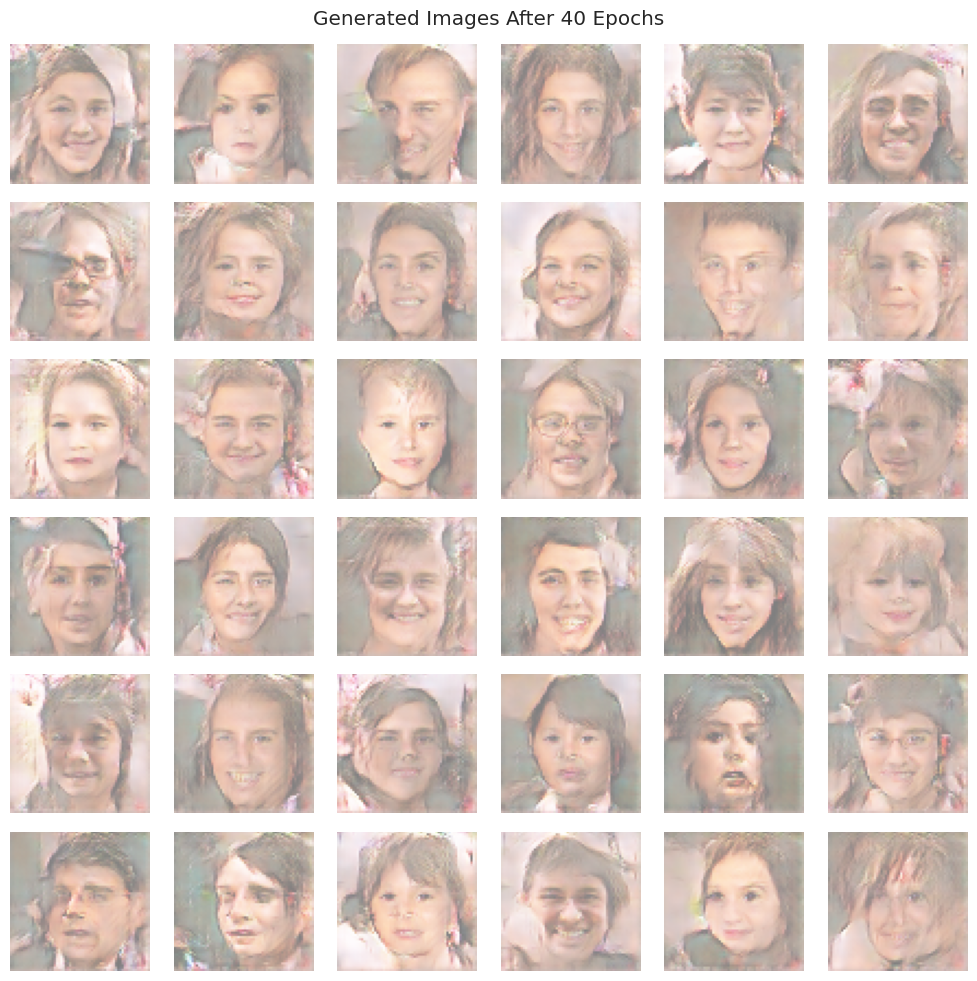

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_40.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 79ms/step - d_loss: 0.5551 - g_loss: 1.3419
Epoch 41/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 77s 75ms/step - d_loss: 0.5368 - g_loss: 1.3905
Epoch 42/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 74ms/step - d_loss: 0.5000 - g_loss: 1.4731
Epoch 43/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 71s 71ms/step - d_loss: 0.5177 - g_loss: 1.4317
Epoch 44/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 84s 72ms/step - d_loss: 0.5183 - g_loss: 1.4215
Epoch 45/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 71ms/step - d_loss: 0.5050 - g_loss: 1.4612
Epoch 46/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 72ms/step - d_loss: 0.5117 - g_loss: 1.4830
Epoch 47/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 71s 71ms/step - d_loss: 0.4972 - g_loss: 1.5044
Epoch 48/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 71s 71ms/step - d_loss: 0.4906 - g_loss: 1.5537
Epoch 49/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 72ms/step - d_loss: 0.5073 - g_loss: 1.4769
Epoch 50/100
 999/100

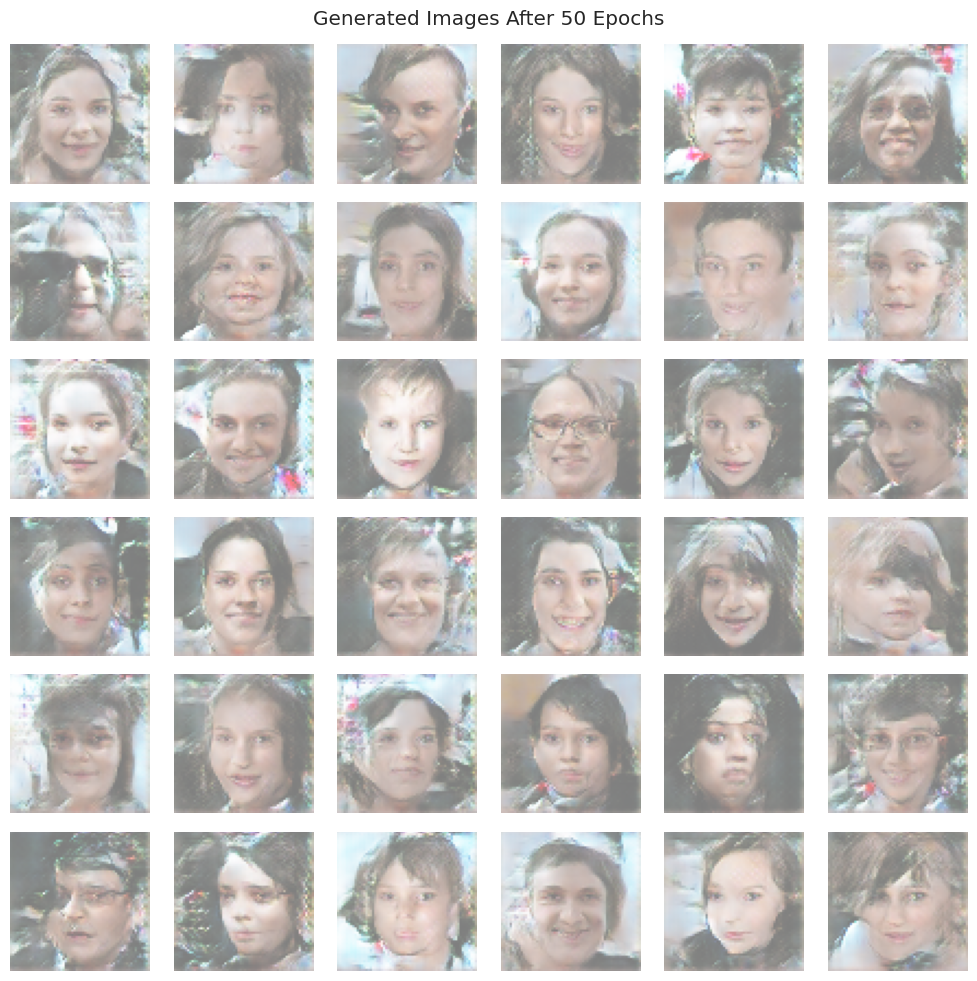

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_50.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 78s 77ms/step - d_loss: 0.4943 - g_loss: 1.5288
Epoch 51/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 76s 72ms/step - d_loss: 0.4808 - g_loss: 1.5755
Epoch 52/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 83s 72ms/step - d_loss: 0.4758 - g_loss: 1.6479
Epoch 53/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 74ms/step - d_loss: 0.4792 - g_loss: 1.5755
Epoch 54/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 72ms/step - d_loss: 0.4855 - g_loss: 1.5685
Epoch 55/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 71ms/step - d_loss: 0.4702 - g_loss: 1.6112
Epoch 56/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 86s 75ms/step - d_loss: 0.4758 - g_loss: 1.5873
Epoch 57/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 75s 75ms/step - d_loss: 0.4872 - g_loss: 1.6093
Epoch 58/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 74ms/step - d_loss: 0.4772 - g_loss: 1.6324
Epoch 59/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 73ms/step - d_loss: 0.4420 - g_loss: 1.6974
Epoch 60/100
1000/100

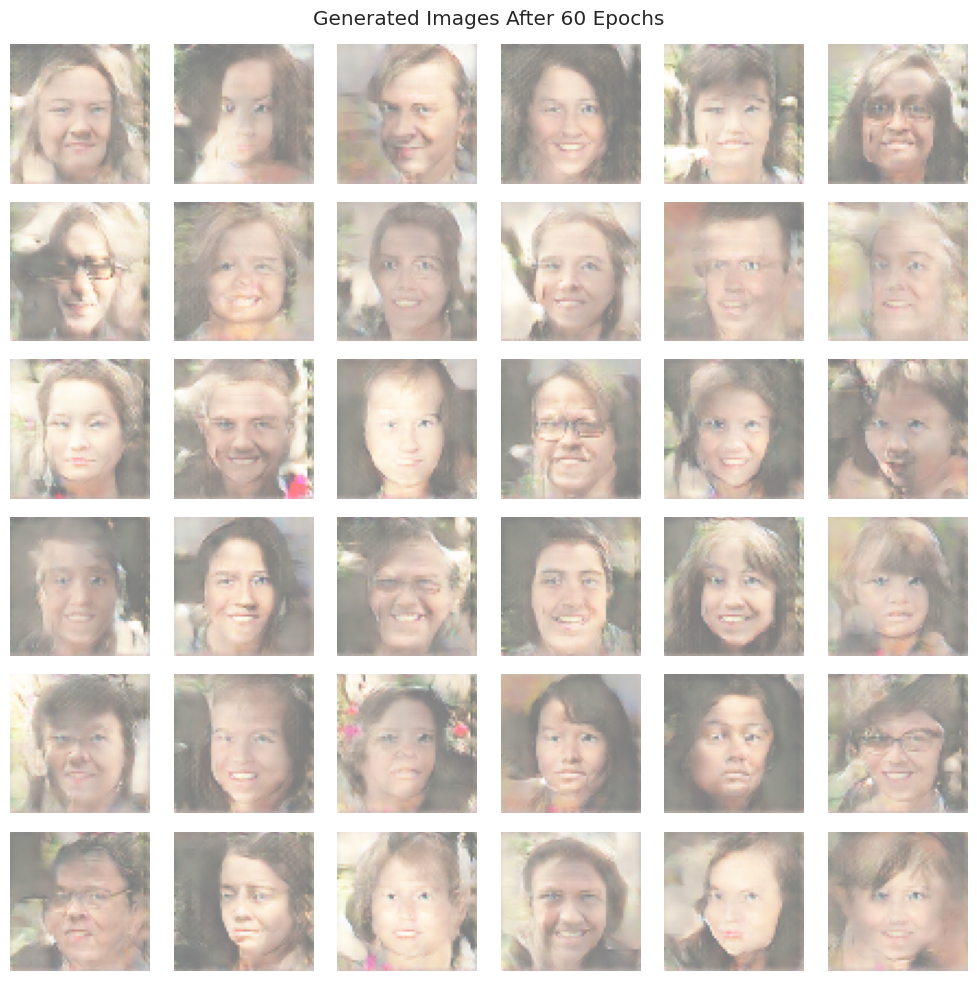

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_60.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 87s 79ms/step - d_loss: 0.4607 - g_loss: 1.6698
Epoch 61/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 78s 74ms/step - d_loss: 0.4397 - g_loss: 1.7531
Epoch 62/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 73ms/step - d_loss: 0.4495 - g_loss: 1.7149
Epoch 63/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 73ms/step - d_loss: 0.4462 - g_loss: 1.7439
Epoch 64/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 72ms/step - d_loss: 0.4316 - g_loss: 1.7851
Epoch 65/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 73s 73ms/step - d_loss: 0.4402 - g_loss: 1.8207
Epoch 66/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 72ms/step - d_loss: 0.4434 - g_loss: 1.8071
Epoch 67/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 83s 74ms/step - d_loss: 0.4242 - g_loss: 1.7800
Epoch 68/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 73ms/step - d_loss: 0.4412 - g_loss: 1.8259
Epoch 69/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 72ms/step - d_loss: 0.4201 - g_loss: 1.7955
Epoch 70/100
1000/100

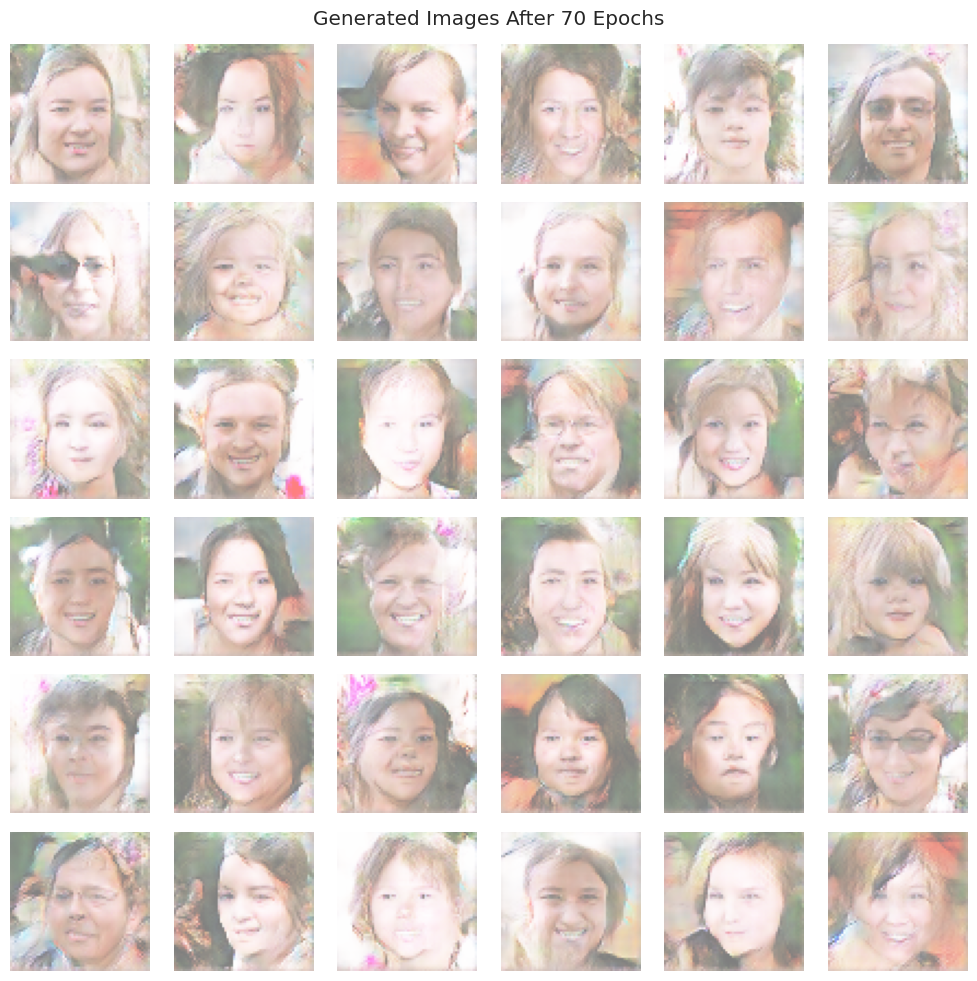

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_70.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 78s 78ms/step - d_loss: 0.4092 - g_loss: 1.8095
Epoch 71/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 78s 74ms/step - d_loss: 0.4411 - g_loss: 1.8670
Epoch 72/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 72s 72ms/step - d_loss: 0.4157 - g_loss: 1.9303
Epoch 73/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 73s 73ms/step - d_loss: 0.4142 - g_loss: 1.9363
Epoch 74/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 84s 74ms/step - d_loss: 0.3974 - g_loss: 1.9032
Epoch 75/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 73s 72ms/step - d_loss: 0.4291 - g_loss: 1.9441
Epoch 76/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 72ms/step - d_loss: 0.3933 - g_loss: 1.9639
Epoch 77/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 84s 74ms/step - d_loss: 0.3907 - g_loss: 2.0303
Epoch 78/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 73ms/step - d_loss: 0.4006 - g_loss: 1.9513
Epoch 79/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 74ms/step - d_loss: 0.3830 - g_loss: 2.0418
Epoch 80/100
 999/100

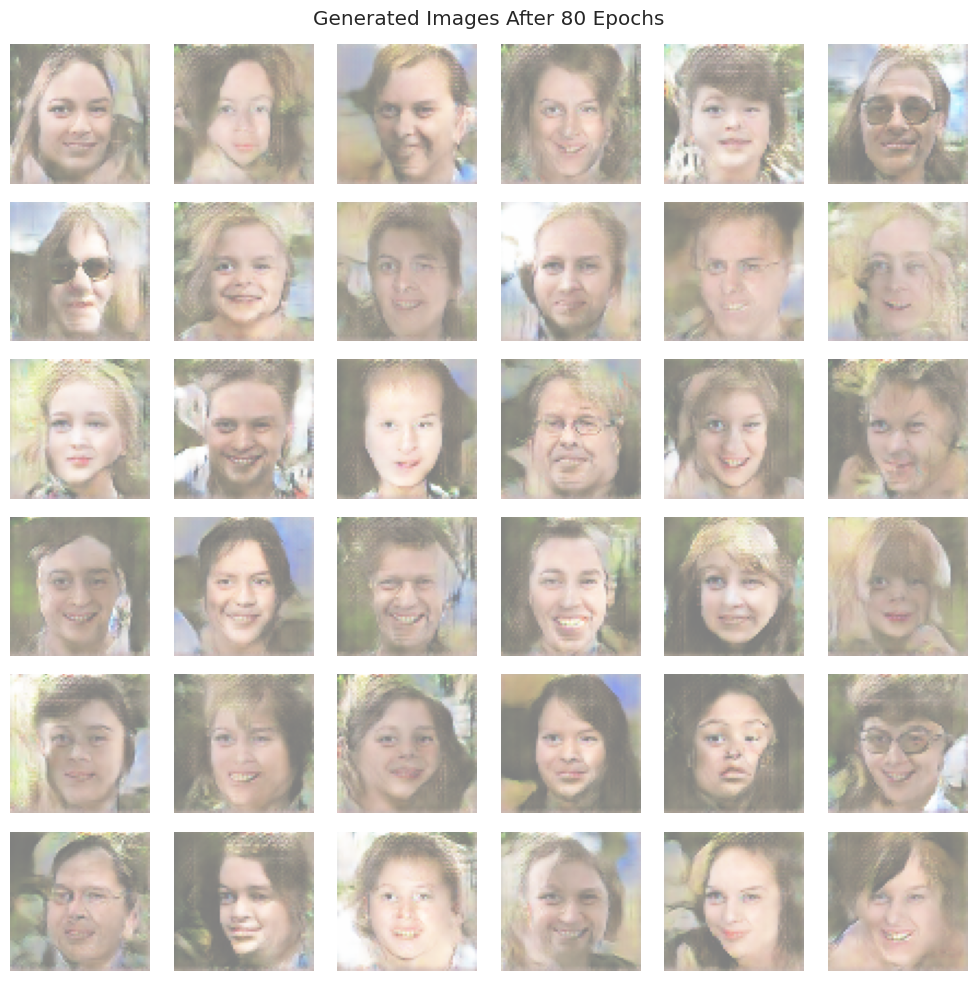

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_80.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 79s 79ms/step - d_loss: 0.3628 - g_loss: 2.0414
Epoch 81/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 73ms/step - d_loss: 0.4006 - g_loss: 1.9796
Epoch 82/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 72ms/step - d_loss: 0.3842 - g_loss: 1.9886
Epoch 83/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 71ms/step - d_loss: 0.3755 - g_loss: 2.1892
Epoch 84/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 83s 72ms/step - d_loss: 0.3619 - g_loss: 2.1385
Epoch 85/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 73s 73ms/step - d_loss: 0.3822 - g_loss: 2.1102
Epoch 86/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 82s 72ms/step - d_loss: 0.3834 - g_loss: 2.0259
Epoch 87/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 73s 72ms/step - d_loss: 0.3608 - g_loss: 2.1025
Epoch 88/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 75s 74ms/step - d_loss: 0.3749 - g_loss: 2.1236
Epoch 89/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 74ms/step - d_loss: 0.3831 - g_loss: 2.1124
Epoch 90/100
1000/100

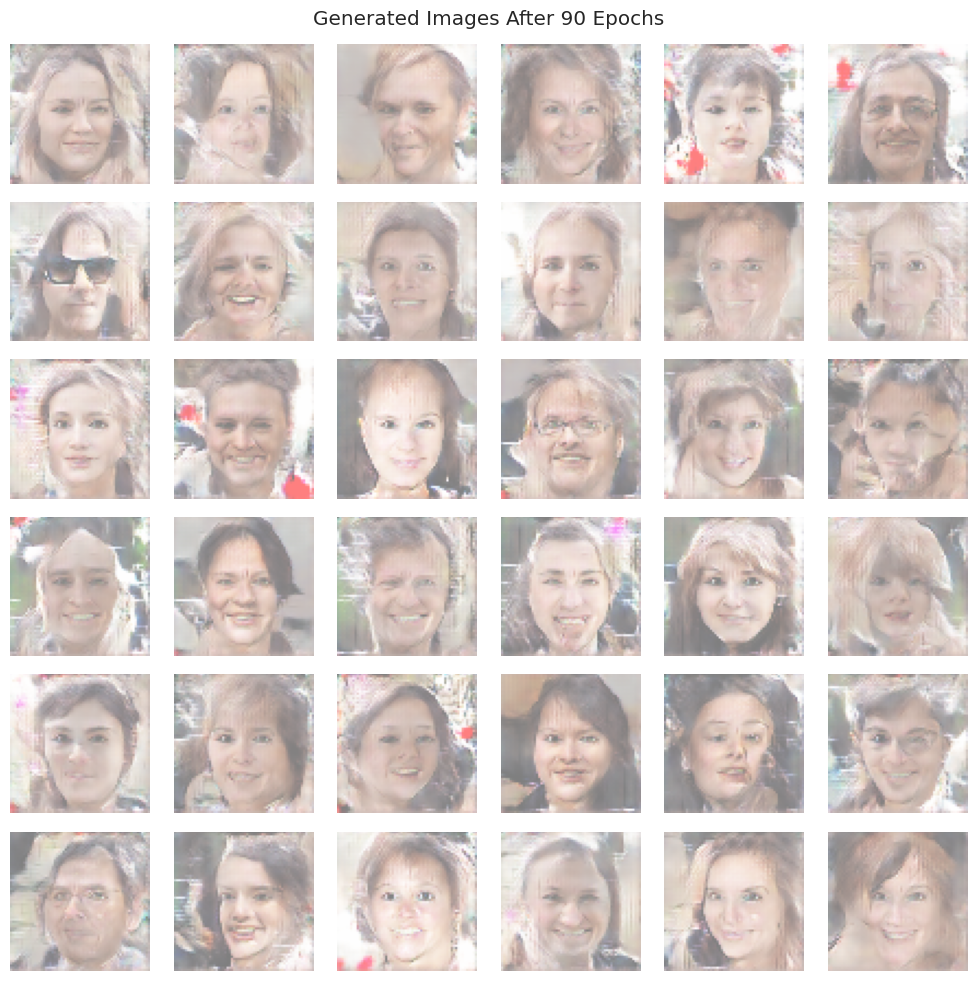

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_90.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 83s 82ms/step - d_loss: 0.3689 - g_loss: 2.1179
Epoch 91/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 136s 76ms/step - d_loss: 0.3392 - g_loss: 2.1105
Epoch 92/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 75ms/step - d_loss: 0.3568 - g_loss: 2.1486
Epoch 93/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 76s 75ms/step - d_loss: 0.3591 - g_loss: 2.1640
Epoch 94/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 74ms/step - d_loss: 0.3525 - g_loss: 2.2210
Epoch 95/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 83s 75ms/step - d_loss: 0.3341 - g_loss: 2.2100
Epoch 96/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 81s 74ms/step - d_loss: 0.3363 - g_loss: 2.2454
Epoch 97/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 74ms/step - d_loss: 0.3762 - g_loss: 2.1473
Epoch 98/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 73s 73ms/step - d_loss: 0.3371 - g_loss: 2.1820
Epoch 99/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 74s 73ms/step - d_loss: 0.3457 - g_loss: 2.2588
Epoch 100/100
 999/1

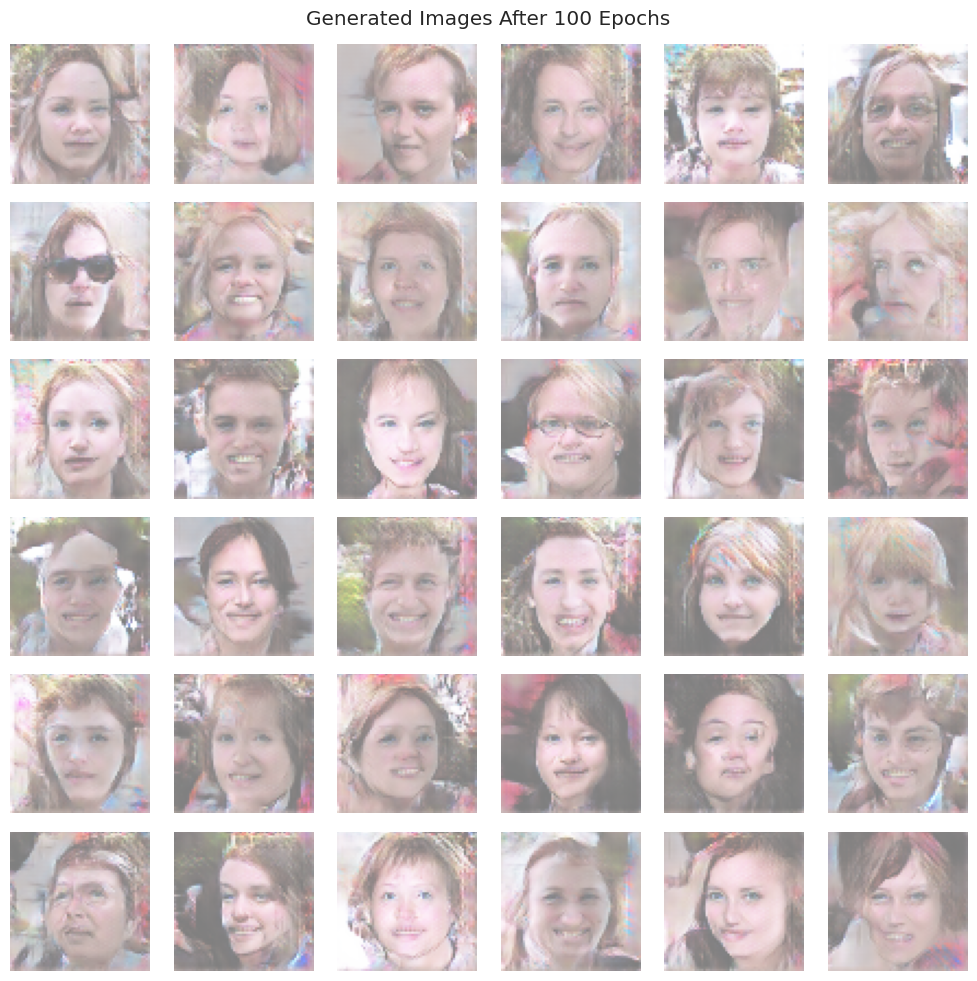

Model saved at /content/drive/MyDrive/GAN_MODEL/model/dcgan_epoch_100.h5
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 80s 80ms/step - d_loss: 0.3584 - g_loss: 2.1385


In [ ]:
# Huấn luyện DCGAN trên tập dữ liệu ảnh trong 100 epochs
epochs = 100  # Số lượng epoch để huấn luyện
lr_g = 0.0002  # Learning rate (tốc độ học) cho Generator
lr_d = 0.00005  # Learning rate cho Discriminator (thấp hơn Generator để giúp cân bằng)
beta = 0.5  # Tham số beta1 cho thuật toán Adam (momentum decay)
latent_dim = 256  # Kích thước không gian ẩn (latent space)

# Khởi tạo mô hình DCGAN
dcgan = DCGAN(
    generator=generator,  # Mô hình Generator đã định nghĩa
    discriminator=discriminator,  # Mô hình Discriminator đã định nghĩa
    latent_dim=latent_dim  # Kích thước latent space
)

# Biên dịch mô hình DCGAN
dcgan.compile(
    g_optimizer=Adam(learning_rate=lr_g, beta_1=beta),  # Optimizer cho Generator
    d_optimizer=Adam(learning_rate=lr_d, beta_1=beta),  # Optimizer cho Discriminator
    loss_fn=BinaryCrossentropy()  # Hàm loss (binary cross-entropy) để phân biệt ảnh thật/giả
)

# Huấn luyện mô hình và lưu lịch sử huấn luyện
history = dcgan.fit(
    train_generator,  # Dữ liệu đầu vào cho quá trình huấn luyện (ảnh thật từ tập huấn luyện)
    epochs=epochs,  # Số lượng epoch
    callbacks= DCGANCallback()  # Callback để lưu mô hình và hiển thị ảnh
)

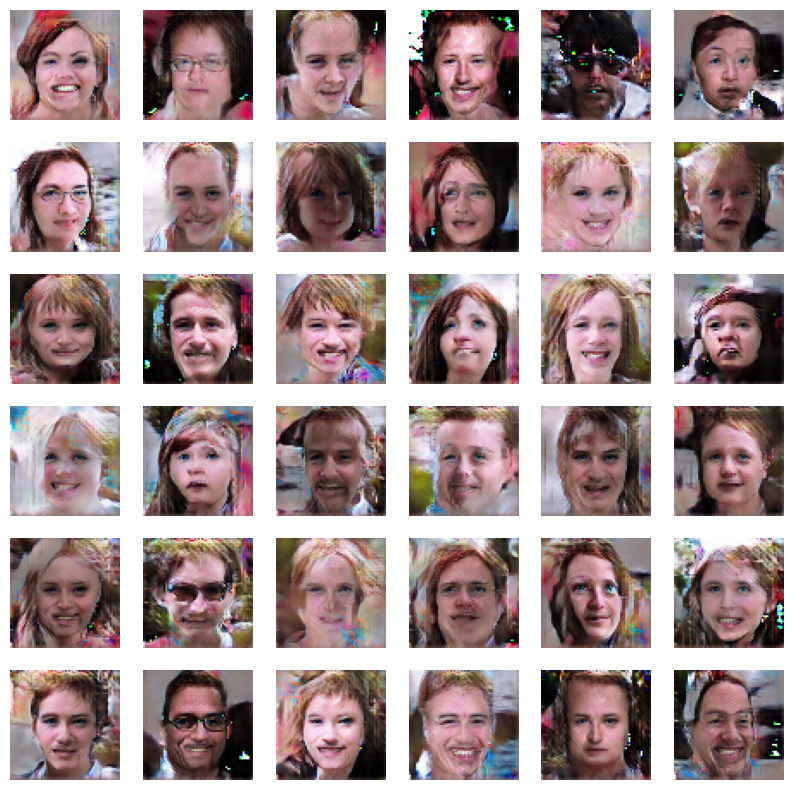

In [ ]:
# Sinh 36 ảnh ngẫu nhiên sử dụng mô hình DCGAN
plt.figure(figsize=(10, 10))  # Kích thước lưới hiển thị (10x10 inch)

for i in range(36):  # Vòng lặp để tạo 36 ảnh
    plt.subplot(6, 6, i + 1)  # Hiển thị ảnh theo dạng lưới 6x6
    # Sinh noise ngẫu nhiên (vector latent) với kích thước [1, 300]
    noise = tf.random.normal([1, 256])
    # Dùng Generator để sinh ảnh từ noise
    mg = dcgan.generator(noise)
    # Chuyển đổi giá trị ảnh từ khoảng [-1, 1] về [0, 255] để hiển thị
    mg = (mg * 255) + 255

    # Chuyển đổi Tensor thành NumPy array để xử lý
    mg.numpy()
    # Chuyển đổi mảng thành ảnh bằng PIL (Python Imaging Library)
    image = Image.fromarray(np.uint8(mg[0]))

    plt.imshow(image)
    plt.axis('off')

plt.show()

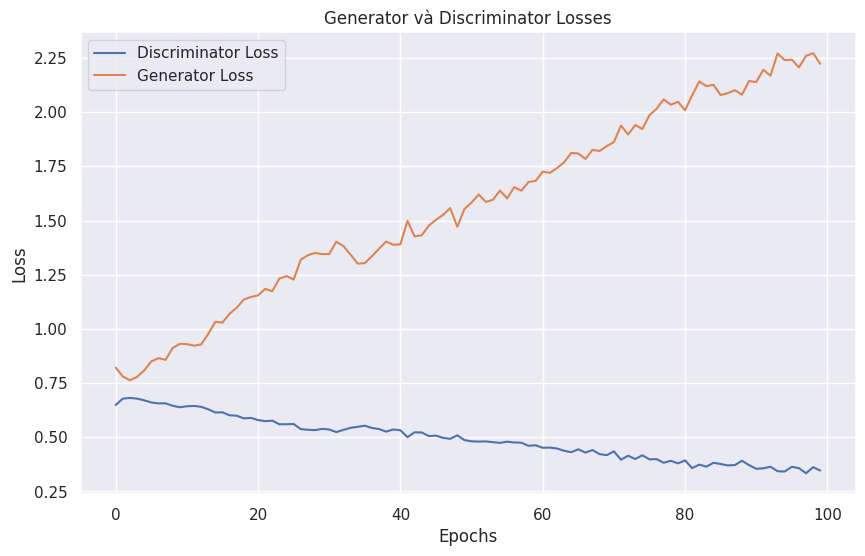

In [ ]:
def create_loss_figure(d_loss_values, g_loss_values):
    plt.figure(figsize=(10, 6))  # Kích thước hình (10 inch x 6 inch)
    plt.plot(d_loss_values, label='Discriminator Loss')  # Vẽ đường biểu diễn loss của Discriminator
    plt.plot(g_loss_values, label='Generator Loss')  # Vẽ đường biểu diễn loss của Generator
    plt.title('Generator và Discriminator Losses')  # Tiêu đề biểu đồ
    plt.xlabel('Epochs')  # Nhãn trục x
    plt.ylabel('Loss')  # Nhãn trục y
    plt.legend()  # Hiển thị chú thích (Legend)
    plt.grid(True)  # Thêm lưới vào biểu đồ
    plt.show()  # Hiển thị biểu đồ


d_loss_values = history.history['d_loss']
g_loss_values = history.history['g_loss']
create_loss_figure(d_loss_values, g_loss_values)